In [1]:
include("../src/photon_raytrace_mcmc.jl")
using LinearAlgebra
using Statistics
using NPZ
using NLsolve
using SpecialFunctions
using Plots

In [2]:
# inputF = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Axion_Infall/notebooks/Gustavo_Compare/MCIWYHMY/MCIWYHMYconversion.npy");
#inputF = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Axion_Infall/notebooks/Gustavo_Compare/MCIWYHMY/MCIWYHMYconversion.npy");
inputF = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Miniclusters_Stockholm/Data/MCBNWLVY/MCBNWLVYconversion.npy")
xIn = inputF[:, 3:5];
vIn = inputF[:, 6:8] / c_km;

In [3]:
# R_MC = 5.28e3
R_MC = 3.12e9
Mass_NS = 1
M_MC = 1e-10
NS_vel_T = π
NS_vel_M = 200.0 ./ c_km;
NS_vel = [0.0 sin.(NS_vel_T) cos.(NS_vel_T)] .* NS_vel_M;
Roche_R = R_MC .* (2 .* Mass_NS ./ M_MC).^(1.0 ./ 3.0) # km
R_guessVal = -[0.0 sin.(NS_vel_T) cos.(NS_vel_T)] .* Roche_R

1×3 Matrix{Float64}:
 -0.0  -0.00103715  8.46898e12

In [4]:
Roche_R

8.4689829637761045e12

In [6]:
RT = RayTracer; # define ray tracer module
runs = 2;

nsteps = 1000;
ln_tstart=-20;
ln_tend=log.(Roche_R ./ (NS_vel_M .* c_km)) ;
tstart = exp.(ln_tstart)
tend = exp.(ln_tend)
ode_err=1e-10;
#NumerP = [ln_tstart, ln_tend, ode_err]
NumerP = [tstart, tend, ode_err]
xF_AX, vF_AX = RT.propagateAxion(xIn[1:runs,:], vIn[1:runs,:] .* c_km, nsteps, NumerP);



┌ Warning: Instability detected. Aborting
└ @ SciMLBase /Users/samuelwitte/.julia/packages/SciMLBase/DXiE6/src/integrator_interface.jl:351


In [7]:
xFin = xF_AX[:, :, end];
vFin = vF_AX[:, :, end];

UpotFin = GNew * 1.0 ./ sqrt.(sum(xFin.^2, dims=2)) ./ c_km.^2;
gam = 1.0 ./ sqrt.(1.0 .- sqrt.(sum((vFin ./ c_km).^2, dims=2)).^2)
KFin = sqrt.(sum((vFin ./ c_km).^2, dims=2)).^2 ./ 2;

UpotFin_Theory =  GNew * 1.0 ./  Roche_R ./ c_km.^2;
KFin_Theory =  (200.0 ./ c_km).^2 ./ 2;
# KFin = (200.0 ./ c_km).^2 ./ 2;
UpotIn = GNew * 1.0 ./ sqrt.(sum(xIn[1:runs,:].^2, dims=2)) ./ c_km.^2;
KIn = sqrt.(sum(vIn[1:runs,:].^2, dims=2)).^2 ./ 2;

In [8]:
print(((-UpotFin .+ KFin) .- (-UpotIn .+ KIn)) ./ (-UpotIn .+ KIn), ((-UpotFin_Theory .+ KFin_Theory) .- (-UpotIn .+ KIn)) ./ (-UpotIn .+ KIn))

[0.0; 0.0][-0.0002508566742946125; -0.0002653395478952475]

In [15]:
(-UpotFin .+ KFin)

2×1 Matrix{Float64}:
 2.2258635405669747e-7
 2.2258957860232798e-7

In [16]:
(-UpotIn .+ KIn)

2×1 Matrix{Float64}:
 2.2258635405669747e-7
 2.2258957860232798e-7

In [17]:
vIn[1,:]

3-element Vector{Float64}:
  0.1553054566975246
 -0.09120852067454091
 -0.23225197916053036

In [18]:
vFin

2×3 Matrix{Float64}:
 46559.3  -27343.6  -69627.3
 95697.6  -56201.7  -60058.1

In [19]:
print((200.0 ./ c_km).^2 ./ 2);

2.2253069114096189e-7

In [20]:
xFin

2×3 Matrix{Float64}:
 -28.5735  16.7808    8.41829
 -12.0106   7.05364  -9.15606

In [34]:
rmag = sqrt.(sum(xIn .^ 2, dims=2));
ϕ = atan.(view(xIn, :, 2), view(xIn, :, 1))
θ = acos.(view(xIn, :, 3)./ rmag)
runs = 5000
vGu = 0.5
errSlve = 1e-20
vel_disp = sqrt.(2 .* GNew .* M_MC ./ R_MC) ./ c_km  # dimensionless
v_perturb = rand(1, 3) .* vel_disp ./ sqrt.(3)
NS_vel_p = NS_vel .+ v_perturb
vel = zeros(runs, 3)
vel2 = zeros(runs, 3)
for i in 1:runs
    velV, accur = RT.solve_vel_CS(θ[i], ϕ[i], rmag[i], NS_vel_p, guess=[vGu vGu vGu], errV=errSlve)
    velV2, accur2 = RT.solve_vel_CS(θ[i], ϕ[i], rmag[i], NS_vel_p, guess=[-vGu -vGu -vGu], errV=errSlve)
    vel[i, :] = velV
    vel2[i, :] = velV2
end


In [22]:
nsteps = 10000;
ln_tstart=-20;
ln_tend=log.(Roche_R ./ (NS_vel_M .* c_km)) ;
tstart = exp.(ln_tstart)
tend = exp.(ln_tend)
ode_err=1e-12;
#NumerP = [ln_tstart, ln_tend, ode_err]
NumerP = [tstart, tend, ode_err]
xF_AX, vF_AX = RT.propagateAxion(xIn[1:runs,:], vel .* c_km, nsteps, NumerP);



┌ Warning: Instability detected. Aborting
└ @ SciMLBase /Users/samuelwitte/.julia/packages/SciMLBase/DXiE6/src/integrator_interface.jl:351


In [23]:
xFin = xF_AX[:, :, end];
vFin = vF_AX[:, :, end];

UpotFin = GNew * 1.0 ./ sqrt.(sum(xFin.^2, dims=2)) ./ c_km.^2;
KFin = sqrt.(sum((vFin ./ c_km).^2, dims=2)).^2 ./ 2;
# KFin = (200.0 ./ c_km).^2 ./ 2;
UpotIn = GNew * 1.0 ./ sqrt.(sum(xIn[1:runs,:].^2, dims=2)) ./ c_km.^2;
KIn = sqrt.(sum(vel.^2, dims=2)).^2 ./ 2;

In [24]:
print(((-UpotFin .+ KFin) .- (-UpotIn .+ KIn)) ./ (-UpotIn .+ KIn))

[3.11817476611068e-11; -9.354524299790494e-11; -3.1181747669857515e-10; -2.8063572895871194e-10; -2.6192668037779915e-9; -5.300897102388157e-10; -8.294344878113041e-9; 3.1181747663051406e-10; -1.5590873831525703e-10; -9.35452429774866e-11]

In [25]:
print(( KFin),  (200.0 ./ c_km).^2 ./ 2)

[0.028904880653259996; 0.042766222250212815; 0.04358022337933526; 0.043557851096637394; 0.07597529408924014; 0.0897949960600593; 0.14766268794412335; 0.03305953871038136; 0.0332133700079438; 0.03317851784963348]2.2253069114096189e-7

In [26]:
vFin

10×3 Matrix{Float64}:
  31122.0       -18277.4  -62394.1
  46101.3       -27074.6  -69490.2
  46981.4       -27591.4  -69749.8
 -47022.8        27615.8  -69683.4
  82033.8       -48177.2  -67867.5
  97289.3       -57136.5   58403.0
      1.1371e5   58338.5      -1.0104e5
  25541.8        13104.1  -71542.8
 -11571.7        64095.5  -41569.0
  11576.7       -64122.7  -41450.1

In [27]:
xFin

10×3 Matrix{Float64}:
 -38.2468    22.4617    25.3463
 -28.7996    16.9136     8.75771
 -28.3676    16.6598     8.11139
  28.3946   -16.6757     8.05684
 -15.8315     9.29761   -6.37664
  11.6007    -6.81289   -9.45668
  -8.65331   -4.43955   -2.32606
 -27.5254   -14.1218    32.2175
   7.14972  -39.6021   -18.8987
  -7.14717   39.5879   -19.0389

In [28]:
using Plots

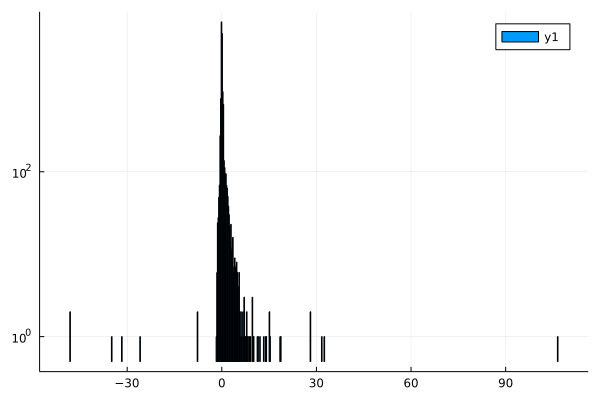

In [35]:
num=5000
hold = zeros(num * 3)
indx=1
for i in 1:num
    # print(vel[i,:] ./ vIn[i,:],"\t",vel2[i,:] ./ vIn[i,:], "\n")
    # print(abs.(vel[i,:] ./ vIn[i,:]), "\n")
    velComp = (abs.(vel[i,:] ./ vIn[i,:]) .- 1.0) .* 100
    hold[indx] = velComp[1]
    indx += 1
    hold[indx] = velComp[2]
    indx += 1
    hold[indx] = velComp[3]
    indx += 1
end
histogram(hold, bins=1000, yscale=:log10)


In [52]:
include("../src/photon_raytrace_mcmc.jl")
using LinearAlgebra
using Statistics
using NPZ
using NLsolve
using SpecialFunctions
using Plots
using LinearAlgebra

In [16]:
# R_MC = 5.28e3
R_MC = 3.12e9
Mass_NS = 1
M_MC = 1e-10
NS_vel_T = π
NS_vel_M = 200.0 ./ c_km;
NS_vel = [0.0 sin.(NS_vel_T) cos.(NS_vel_T)] .* NS_vel_M;
Roche_R = R_MC .* (2 .* Mass_NS ./ M_MC).^(1.0 ./ 3.0) # km
R_guessVal = -[0.0 sin.(NS_vel_T) cos.(NS_vel_T)] .* Roche_R

1×3 Matrix{Float64}:
 -0.0  -0.00103715  8.46898e12

In [17]:
size(inputF)

(58378, 8)

In [18]:
RT = RayTracer; # define ray tracer module

indx1 = 4
indx2 = indx1 + 1
mPts1 = 1
mPts2 = 1
#inputF = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Miniclusters_Stockholm/Data/trajhigherrp/traj"*string(indx1)*".npy");
#inputF2 = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Miniclusters_Stockholm/Data/trajhigherrp/traj"*string(indx2)*".npy");
inputF = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Miniclusters_Stockholm/Data/trajs_new/trajp"*string(indx1)*".npy");

inputF2 = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Miniclusters_Stockholm/Data/trajs_new/trajp"*string(indx2)*".npy")
#inputF2 = npzread("/Users/samuelwitte/Dropbox/Magnetized_Plasma/Miniclusters_Stockholm/Data/trajs_small/trajp25.npy")
#mPts1 = size(inputF)[1] - 1
#mPts2 = size(inputF2)[1] - 1
xIn = transpose(cat(inputF[end-mPts1, 2:4], inputF2[end-mPts2, 2:4], dims=2)) .* 1.0;
vIn = transpose(cat(inputF[end-mPts1, 5:7], inputF2[end-mPts2, 5:7], dims=2)) ./ c_km;

xOut = transpose(cat(inputF[1, 2:4], inputF2[1, 2:4], dims=2)) .* 1.0;
vOut = transpose(cat(inputF[1, 5:7], inputF2[1, 5:7], dims=2)) ./ c_km;

In [19]:
rmag = sqrt.(sum(xIn .^ 2, dims=2));
ϕ = atan.(view(xIn, :, 2), view(xIn, :, 1))
θ = acos.(view(xIn, :, 3)./ rmag)
runs = length(rmag)
vGu = 0.5
errSlve = 1e-20
vel_disp = sqrt.(2 .* GNew .* M_MC ./ R_MC) ./ c_km  # dimensionless
v_perturb = rand(1, 3) .* vel_disp ./ sqrt.(3)
NS_vel_p = NS_vel .+ v_perturb .* 1e-10
vel = zeros(runs, 3)
vel2 = zeros(runs, 3)
for i in 1:runs

    velV, accur = RT.solve_vel_CS(θ[i], ϕ[i], rmag[i], NS_vel_p, guess=[vGu vGu vGu], errV=errSlve)
    velV2, accur2 = RT.solve_vel_CS(θ[i], ϕ[i], rmag[i], NS_vel_p, guess=[-vGu -vGu -vGu], errV=errSlve)
    vel[i, :] = velV
    vel2[i, :] = velV2
end

In [20]:
print(vel[1,:], "\n", vel2[1,:], "\n", vIn[1,:])

[0.19063055614072316, 2.3841850137305797e-18, -0.16671553473661474]
[-0.19129137771258356, -2.214373739095008e-18, 0.16595688376761736]
[-0.24753752642975066, 0.0, 0.053471976973094075]

In [21]:
xIn

2×3 Matrix{Float64}:
 -45.613  0.0  -6.31726
 -45.621  0.0  -6.31553

In [22]:
function v_infinity(θ, ϕ, r, vel_loc; v_comp=1, Mass_NS=1)
    vx, vy, vz = vel_loc
    vel_loc_mag = sqrt.(sum(vel_loc.^2))
    GMr = GNew .* Mass_NS ./ r ./ (c_km .^ 2); # unitless

    v_inf = sqrt.(vel_loc_mag.^2 .- (2 .* GMr)); # unitless
    
    rhat = [sin.(θ) .* cos.(ϕ) sin.(θ) .* sin.(ϕ) cos.(θ)]
    
    denom = v_inf.^2 .+ GMr .- v_inf .* sum(vel_loc .* rhat);
    if v_comp == 1
        v_inf_comp = (v_inf.^2 .* vx .+ v_inf .* GMr .* rhat[1] .- v_inf .* vx .* sum(vel_loc .* rhat)) ./ denom
    elseif v_comp == 2
        v_inf_comp = (v_inf.^2 .* vy .+ v_inf .* GMr .* rhat[2] .- v_inf .* vy .* sum(vel_loc .* rhat)) ./ denom
    elseif v_comp == 3
        v_inf_comp = (v_inf.^2 .* vz .+ v_inf .* GMr .* rhat[3] .- v_inf .* vz .* sum(vel_loc .* rhat)) ./ denom
    end
    #print("here...", vel_loc .* rhat, "\n")

    test1 = (v_inf.^2 .* vx .+ v_inf .* GMr .* rhat[1] .- v_inf .* vx .* sum(vel_loc .* rhat)) ./ denom
    test2 = (v_inf.^2 .* vy .+ v_inf .* GMr .* rhat[2] .- v_inf .* vy .* sum(vel_loc .* rhat)) ./ denom
    test3 = (v_inf.^2 .* vz .+ v_inf .* GMr .* rhat[3] .- v_inf .* vz .* sum(vel_loc .* rhat)) ./ denom
    return v_inf_comp
end

v_infinity (generic function with 1 method)

In [23]:
vIn

2×3 Matrix{Float64}:
 -0.247538  0.0  0.053472
 -0.247515  0.0  0.0534751

In [24]:
indx = 2
vx=v_infinity(θ[indx], ϕ[indx], rmag[indx], transpose(vIn[indx,:]), v_comp=1);
vy=v_infinity(θ[indx], ϕ[indx], rmag[indx], transpose(vIn[indx,:]), v_comp=2);
vz=v_infinity(θ[indx], ϕ[indx], rmag[indx], transpose(vIn[indx,:]), v_comp=3);
velT =[vx vy vz] ;
print(velT, "\n", sqrt.(sum(velT.^2)) .* c_km, "\n", sqrt.(sum(velT.^2)))

[0.0005634786962013376 8.132982204752428e-20 -0.0003571528871029707]
200.00113322403044
0.000667132989619571

In [25]:
vx=v_infinity(θ[1], ϕ[1], rmag[1], vel[1,:], v_comp=1);
vy=v_infinity(θ[1], ϕ[1], rmag[1], vel[1,:], v_comp=2);
vz=v_infinity(θ[1], ϕ[1], rmag[1], vel[1,:], v_comp=3);
velT =[vx vy vz] 
print(velT, "\t", sqrt.(sum(velT.^2)) .* c_km)

[-0.0005508985035710561 8.225083896080374e-20 -0.0001872700517880699]	174.43650269682627

In [53]:
RT = RayTracer; # define ray tracer module
runs = 1;

nsteps = 1000;
ln_tstart=-20;
ln_tend=log.(Roche_R ./ (NS_vel_M .* c_km)) ;
# ln_tend= -7;
tstart = exp.(ln_tstart)
tend = exp.(ln_tend)
ode_err=1e-15;
NumerP = [ln_tstart, ln_tend, ode_err]
# NumerP = [tstart, tend, ode_err]
xF_AX, vF_AX = RT.propagateAxion(xIn, vIn .* c_km, nsteps, NumerP);

In [54]:
xF_AX[:,:,end]

2×3 Matrix{Float64}:
     1.47245e7  0.0  8.47716e12
 99002.8        0.0  8.46908e12

In [266]:
xOut

2×3 Matrix{Float64}:
 6000.0  0.0  8.0e12
 6000.0  0.0  8.0e12

In [272]:
vF_AX[:, :, end] ./ c_km

2×3 Matrix{Float64}:
 -1.15955e-9   0.0  -0.00066777
 -7.44874e-12  0.0  -0.000667133

In [271]:
vOut

2×3 Matrix{Float64}:
 0.0  0.0  -0.000667129
 0.0  0.0  -0.000667129

In [269]:
xIn

2×3 Matrix{Float64}:
 -45.613  0.0  -6.31726
 -45.621  0.0  -6.31553

In [270]:
vIn

2×3 Matrix{Float64}:
 -0.247538  0.0  0.053472
 -0.247515  0.0  0.0534751

In [40]:
#for i in 1:length(inputF[:,1])
KE1 = 0.5 .* sum((inputF[:,5:7] ./ c_km).^2,dims=2)
KE2 = 0.5 .* sum((inputF2[:,5:7] ./ c_km).^2, dims=2)
UE1 = -GNew * 1.0 ./ sqrt.(sum(inputF[:,2:4].^2, dims=2)) ./ c_km.^2;
UE2 = -GNew * 1.0 ./ sqrt.(sum(inputF2[:,2:4].^2, dims=2)) ./ c_km.^2;

KET = 0.5 .* sum((vF_AX./ c_km).^2,dims=2)
UTT = -GNew * 1.0 ./ sqrt.(sum(xF_AX.^2, dims=2)) ./ c_km.^2;

initE1 = KE1[1] .+ UE1[1]
initE2 = KE2[1] .+ UE2[1]

initET1 = KET[1,1,1].+UTT[1,1,1]
initET2 = KET[2,1,1].+UTT[2,1,1]

2.225332128846791e-7

In [41]:
test_G1 = ((KE1.+UE1) .- initE1 ) ./ initE1
test_G2 = ((KE2.+UE2) .- initE2 ) ./ initE2

print(abs.(test_G1[end]), "\t", abs.(test_G2[end]), "\n", minimum(sqrt.(sum(inputF[:,2:4].^2, dims=2))), "\t",  minimum(sqrt.(sum(inputF2[:,2:4].^2, dims=2))), "\t", maximum(sqrt.(sum(inputF[:,2:4].^2, dims=2))), "\t",  maximum(sqrt.(sum(inputF2[:,2:4].^2, dims=2))))

0.0019225828332092938	1.21615765890122e-5
6.485937586616176	6.485937597480948	8.0e12	8.0e12

In [42]:
v = zeros(2,3)
v2 = zeros(2,3)
vM = zeros(2,3)
vM2 = zeros(2,3)
for i in 1:2
    v[i,:] = cross(xOut[i,:], vOut[i,:])
    v2[i,:] = cross(xIn[i,:], vIn[i,:])
    vM[i,:] = cross(xF_AX[i,:,end], vF_AX[i, :, end] ./ c_km)
    vM2[i,:] = cross(xF_AX[i,:,1], vF_AX[i, :, 1] ./ c_km)
end

In [43]:
print(v,"\n",v2,"\n", vM, "\n", vM2, "\n")

[-0.0 4.002775257511875 0.0; -0.0 4.002775257511875 0.0]
[0.0 4.00277525751225 0.0; 0.0 4.002775257511076 0.0]
[-0.0 4.002772331237793 -0.0; -0.0 4.002776622772217 -0.0]
[0.0 4.00277525751225 0.0; 0.0 4.002775257511076 0.0]


In [44]:
testS1 = abs.((KET[1,1,:].+UTT[1,1,:]) .- initET1 ) ./ initET1;
testS2 = abs.((KET[2,1,:].+UTT[2,1,:]) .- initET2 ) ./ initET2;
print(testS1[end], "\t", testS2[end], "\n")

3.8241121449487064e-7	3.8111482600453024e-7


In [66]:
include("../src/photon_raytrace_mcmc.jl")
using ChangePrecision

In [231]:
RT = RayTracer; # define ray tracer module
runs = 1;

nsteps = 1000;

ode_err=2.5e-14;
saveT = inputF[:,1]
saveT = [saveT[1]; saveT[end]]
NumerP = [saveT[1], saveT[end], ode_err]
xF_AX, vF_AX = RT.propagateAxion_backwards(xOut, vOut .* c_km, nsteps, saveT, NumerP);
print(xF_AX)


[12000.0 0.0 8.0e12; 6000.0 0.0 8.0e12]

[12000.0 0.0 7.999999999986697e12; 6000.0 0.0 7.999999999986697e12]

In [232]:
xF_AX

2×3×2 Array{Float64, 3}:
[:, :, 1] =
 12000.0  0.0  8.0e12
  6000.0  0.0  8.0e12

[:, :, 2] =
 12000.0  0.0  8.0e12
  6000.0  0.0  8.0e12

In [233]:
xIn

2×3 Matrix{Float64}:
 -45.9893  0.0   2.48792
 -45.621   0.0  -6.31553

In [8]:
vF_AX ./ c_km

2×3×2 Array{Float64, 3}:
[:, :, 1] =
 0.0  0.0  -0.000667129
 0.0  0.0  -0.000667129

[:, :, 2] =
 -0.270297  0.0  0.354811
 -0.270297  0.0  0.354811

In [104]:
rmag = sqrt.(sum(xF_AX[:,:,2]  .^ 2, dims=2));
ϕ = atan.(view(xF_AX[:,:,2] , :, 2), view(xF_AX[:,:,2] , :, 1))
θ = acos.(view(xF_AX[:,:,2] , :, 3)./ rmag)

vx=v_infinity(θ[1], ϕ[1], rmag[1], vF_AX[1,:,2]./ c_km, v_comp=1);
vy=v_infinity(θ[1], ϕ[1], rmag[1], vF_AX[1,:,2]./ c_km, v_comp=2);
vz=v_infinity(θ[1], ϕ[1], rmag[1], vF_AX[1,:,2]./ c_km, v_comp=3);
velT =[vx vy vz] 
print(velT .* c_km, "\n", sqrt.(sum(velT.^2)) .* c_km)

[-181.25747098791248 2.4417000075157813e-14 -32.80362861590242]
184.20192409229603

In [230]:

plot(xF_AX[2,3,:], xF_AX[2,1,:])
plot!(inputF2[2:end, 4], inputF2[2:end, 2], linestyle=:dot)